# **Summary**

This project aimed to classify diabetes patient records into one of the three categories of being readmitted to the hispital: 'NO', '<30', and '>30'. To achieve that, we have implemented Random Forest, KNN, and CNN algorithms. We started with the preliminary exploratory data analysis to see if there was any clear association between certain features and the target variable. Then, to reduce the dimesions of our large dataset, we implemented numerous feature selection methods: filter methods (chi-squared, mutual information, ANOVA f-test), a wrapper method (Recursive Feature Elimination), and an embedded method (Lasso regression). After the least informative features were detected, we encoded the features and the label appropriately (one-hot encoding, ordinal encoding, and label encoding)and split them into training and test sets. One important transformation we applied to the data was a balancing technique SMOTETomek, which was used to increase the count of the minority class and improve model training. We have then applied cross-validation and grid search analysis to find the best parameters for the models and mitigate the bias of data splitting. We have used the F-1 score to guide the optimization. As a result, a Random Forest model with n_estimators=400 and max_depth=50 generated the highest test AUC score of 0.86, making it the best model. In addition, we have computed several relevant performance metrics, generated a confusion matrix to display the predictions, and visualized the ROC curves with respective AUC scores for each class. 

![Model Pipeline](/Users/vladandreichuk/Desktop/git_reps/CS156-Finding-Patterns-in-Data-with-Machine-Learning/CS156_Model_Flowchart_Pipeline_2.png)

# **Data**

The dataset employed in this study is the "Diabetes 130-US hospitals for years 1999-2008" dataset, a comprehensive repository of electronic health records (EHRs) from various hospitals across the United States. These EHRs encompass a broad spectrum of information related to diabetes patients admitted to these hospitals during the years 1999 to 2008. 
The dataset was obtained from the UCI Machine Learning Repository. It was originally sourced from the Health Facts database, which collects data from a multitude of hospitals across the United States. The dataset was anonymized and compiled for research purposes, ensuring patient privacy and compliance with ethical standards.

The dataset comprises a substantial volume of data, with approximately 100,000 records, each representing a unique patient encounter. It is structured as a comma-separated values (CSV) file, facilitating ease of access and manipulation. The dataset consists of 50 columns, encompassing both numerical and categorical attributes. Each column provides distinct information about the patient encounter, including patient demographics, medical diagnoses, treatment procedures, and outcomes.

The features within the dataset encompass a wide array of patient and hospital-related attributes. Key features include:

- **Patient Demographics:** This category includes patient-related information such as age, gender, and race, enabling a comprehensive understanding of the patient population under consideration.

- **Diagnosis Codes:** The dataset includes three primary diagnosis codes (diag_1, diag_2, diag_3), which are essential for identifying the primary medical condition that led to hospitalization. These codes are classified according to the International Classification of Diseases (ICD) system.

- **Treatment Procedures:** Information about medical procedures and treatments administered to patients during their hospital stay is captured. This category aids in understanding the therapeutic interventions provided to patients.

- **Medication and Dosages:** Details about the medications prescribed to patients, including their names and dosages, are included. This information is crucial for medication-related analysis.

- **Outcome Variable:** The dataset contains a target variable "readmitted," which indicates whether a patient was readmitted within 30 days, after 30 days, or not readmitted.


# **Imports**

In [119]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
import plotly.subplots as sp
from scipy import stats
import math
from sklearn.feature_selection import (
    mutual_info_classif,
    SelectKBest,
    chi2,
    f_classif,
    RFE,
    RFECV,
)
from sklearn.preprocessing import (
    StandardScaler,
    LabelEncoder,
    OneHotEncoder,
    OrdinalEncoder,
    label_binarize,
)
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import Lasso
from tqdm import tqdm
from sklearn.decomposition import PCA
from sklearn.model_selection import (
    GridSearchCV,
    KFold,
    train_test_split,
    StratifiedKFold,
    RandomizedSearchCV,
    cross_val_score,
)
from sklearn.metrics import (
    classification_report,
    confusion_matrix,
    accuracy_score,
    precision_score,
    recall_score,
    f1_score,
    roc_auc_score,
    roc_curve,
    auc,
)
from plotly.subplots import make_subplots
from imblearn.over_sampling import SVMSMOTE, BorderlineSMOTE, SMOTE
from imblearn.combine import SMOTETomek
from sklearn.compose import ColumnTransformer
from imblearn.pipeline import Pipeline
from sklearn.naive_bayes import GaussianNB
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
import xgboost as xgb
from xgboost import XGBClassifier
from scikeras.wrappers import KerasClassifier
from keras.models import Sequential
from keras.layers import Conv1D, MaxPooling1D, Flatten, Dense, Dropout
from keras.optimizers import Adam
import tensorflow as tf
from tensorflow import keras
from kerastuner.tuners import RandomSearch
import copy
import keras
from keras import layers

In [2]:
diab_df = pd.read_csv(
    "/Users/vladandreichuk/Desktop/Comparative-Analysis-of-ML-Algorithms-Predicting-Hospital-Readmission-of-Diabetes-Patients/diabetic_data.csv"
)

# **Exploratory Data Analysis**

Exploratory Data Analysis (EDA) is a critical initial step in the data analysis process, allowing us to gain a deep understanding of the variables at hand, their relationships, and potential outliers or anomalies. Through a combination of visualizations, we aim to provide a clear and insightful overview of our data, setting the stage for the rigorous analysis and interpretation that follows.

First, we were interested to see how these demographic variables relate to our target variable ‘readmitted’. We want to understand if there is any association, bias, or skewness in distributions of 3 ‘readmitted’ categories by race, gender, and age. This analysis can help us better understand if certain groups of patients are more likely to be readmitted and motivate further investigation, which might later help correctly interpret ML models’ results. For this purpose, we have constructed several bar plots showing the proportions of 'readmitted' categories across variables of interest.

From the bar plots below, we could not identify any significant differences in 'readmitted' distributions across genders and races. However, we did notice that older patients were more likely to be readmitted, which is expected since older people tend to have more health problems and younger people.

We were also interested in seeing how does the prescription of a diabetes medication alter the chances of being readmitted. From the bar plot below, we did not find any notable difference in 'readmitted' distribution between patients who were prescribed diabetes medication and those who were not.

Lastly, it was interesting to explore if there was any association between the time patients spent in the hospital and their likelihood of being readmitted. Comparing the histograms of the time spent in the hospital across 'readmitted' categories, we see that they are almost identical, suggesting no preliminary association.

Overall, these insightful findings regarding the relationships between certain features and the 'readmitted' target variable provide a strong foundation for shaping our data analysis and interpreting the results of machine learning models in the future. The absence of significant biases, imbalances, or associations suggests that, at this stage, we can proceed with a relatively unbiased approach to building and training machine learning models.

In [178]:
# Display the top rows of the dataset
diab_df

,race,gender,age,admission_type_id,discharge_disposition_id,admission_source_id,time_in_hospital,num_lab_procedures,num_procedures,num_medications,...,glipizide-metformin,glimepiride-pioglitazone,metformin-rosiglitazone,metformin-pioglitazone,change,diabetesMed,readmitted,outliers,outpatient,emergency
0,Caucasian,Female,[0-10),6,25,1,1,41,0,1,...,No,No,No,No,No,No,NO,False,0,0
1,Caucasian,Female,[10-20),1,1,7,3,59,0,18,...,No,No,No,No,Ch,Yes,>30,False,0,0
2,AfricanAmerican,Female,[20-30),1,1,7,2,11,5,13,...,No,No,No,No,No,Yes,NO,False,1,0
3,Caucasian,Male,[30-40),1,1,7,2,44,1,16,...,No,No,No,No,Ch,Yes,NO,False,0,0
4,Caucasian,Male,[40-50),1,1,7,1,51,0,8,...,No,No,No,No,Ch,Yes,NO,False,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
101761,AfricanAmerican,Male,[70-80),1,3,7,3,51,0,16,...,No,No,No,No,Ch,Yes,>30,False,0,0
101762,AfricanAmerican,Female,[80-90),1,4,5,5,33,3,18,...,No,No,No,No,No,Yes,NO,False,0,0
101763,Caucasian,Male,[70-80),1,1,7,1,53,0,9,...,No,No,No,No,Ch,Yes,NO,False,1,0
101764,Caucasian,Female,[80-90),2,3,7,10,45,2,21,...,No,No,No,No,Ch,Yes,NO,False,0,0


In [179]:
# Display the summary of the columns
diab_df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 100114 entries, 0 to 101765
Data columns (total 44 columns):
 #   Column                    Non-Null Count   Dtype 
---  ------                    --------------   ----- 
 0   race                      100114 non-null  object
 1   gender                    100114 non-null  object
 2   age                       100114 non-null  object
 3   admission_type_id         100114 non-null  object
 4   discharge_disposition_id  100114 non-null  object
 5   admission_source_id       100114 non-null  object
 6   time_in_hospital          100114 non-null  int64 
 7   num_lab_procedures        100114 non-null  int64 
 8   num_procedures            100114 non-null  int64 
 9   num_medications           100114 non-null  int64 
 10  number_inpatient          100114 non-null  int64 
 11  diag_1                    100114 non-null  object
 12  diag_2                    100114 non-null  object
 13  diag_3                    100114 non-null  object
 14  number_di

In [181]:
def readmitted_by_feature(metric):
    """
    This function groups the data by the specified 'metric' and 'readmitted' status, calculates the percentage of readmitted patients for each category, and creates a bar plot using Plotly Express.
    The resulting plot displays the distribution of readmission percentages across categories of the specified 'metric,' providing insights into how different factors may affect patient readmission rates.

    Parameters:
        metric (str): The name of the feature (column) used for grouping data and creating the bar plot.
    """
    # Group the data by 'metric' and 'readmitted', and calculate the count for each combination
    grouped_data = diab_df.groupby([metric, "readmitted"]).size().unstack()

    # Calculate the percentage of readmitted patients for each category
    total_counts = grouped_data.sum(axis=1)
    for col in grouped_data.columns:
        grouped_data[col] = (grouped_data[col] / total_counts) * 100

    # Calculate the sum of percentages in '<30' and '>30' categories and sort by it
    grouped_data["sum_percentages"] = grouped_data["<30"] + grouped_data[">30"]
    grouped_data = grouped_data.sort_values(by="sum_percentages", ascending=True)
    grouped_data.drop(columns="sum_percentages", inplace=True)

    # Create a DataFrame for Plotly
    grouped_data_reset = grouped_data.reset_index()

    # Create the bar plot using Plotly
    fig = px.bar(
        grouped_data_reset,
        x=metric,
        y=["<30", ">30", "NO"],
        barmode="relative",
        labels={metric: metric, "value": "Percentage"},
        color_discrete_sequence=px.colors.qualitative.Pastel,
        title=f"Readmission Patient Percentage by {metric}",
    )

    # Customize the plot layout
    fig.update_layout(
        xaxis_title=metric,
        yaxis_title="Percentage",
        legend_title_text="Readmission Category",
    )

    # Display the plot
    fig.show()

In [182]:
readmitted_by_feature(metric='race')

In [183]:
readmitted_by_feature(metric='gender')

In [184]:
readmitted_by_feature(metric='age')

In [185]:
readmitted_by_feature(metric='diabetesMed')

In [186]:
# Histogram of time_in_hospital across values in readmitted
fig = px.histogram(
    diab_df,
    x="time_in_hospital",
    color="readmitted",
    category_orders={"readmitted": ["NO", "<30", ">30"]},
)
fig.update_layout(
    title="Distribution of the Time Spent in the Hospital for Patients with Different Readmittance",
    yaxis_title="Number of Patients",
)
fig.show()

# **Data Preprocessing**

## **Preliminary Feature Cleaning**


In our approach to preprocessing the diabetes patient dataset, we started by loading the data into a Pandas DataFrame named diab_df. A preliminary examination using diab_df.info() provided essential insights into the dataset's structure and data types, laying the foundation for subsequent decisions.

The challenge of missing values was tackled head-on. Prinitng out the head of the dataset revealed that the missing values are shown as '?', so I opted to replace '?' with NaN using diab_df.replace('?', np.nan, inplace=True). This choice is neccesary so that later we could apply various imputation strategies as they mostly only recognize 'NaN' values and not '?'.

We also noticed that columns 'A1Cresult' and 'max_glu_serum' contain 'None' values, which represent the fact that the corresponding test was not taken rather than indicating a missing value. To prevent any confusion in the future (some tools interprete these values as missing), we replaced 'None' with 'No'.

To refine the dataset, we identified and removed columns with a single unique value using diab_df.columns[diab_df.nunique() == 1]. This step ensured that only features with meaningful variability were retained, contributing to a more focused and efficient dataset for analysis. This method identified two columns - 'examide', 'citoglipton' - that only contain 1 value. In addition to these columns Columns 'encounter_id', 'patient_nbr', and 'payer_code' were also dropped as they were deemed irrelevant to the predictive task.

Given the map of IDs that the dataset came with, we noticed that some IDs in a 'discharge_disposition_id' column represent patients who died at some point. To adress this issue, we strategically removed instances associated with specific patient IDs, acknowledging the impossibility of readmission for this subset. This precision in data exclusion aligns with the overarching goal of constructing a predictive model grounded in realistic scenarios.

In [3]:
#Since missing values are represented as ?, change them to NaN
diab_df.replace('?', np.nan, inplace=True)

In [4]:
# Prevent 'None' values being interpreted as np.nan
diab_df['A1Cresult'] = diab_df['A1Cresult'].replace(np.nan,'No')
diab_df['max_glu_serum'] = diab_df['max_glu_serum'].replace(np.nan,'No')

In [5]:
# Find columns with only one unique value
single_unique_columns = diab_df.columns[diab_df.nunique() == 1]

single_unique_columns

Index(['examide', 'citoglipton'], dtype='object')

In [6]:
# Drop irrelevant columns from the DataFrame
columns_to_drop = ['encounter_id', 'patient_nbr', 'payer_code','examide','citoglipton']
diab_df = diab_df.drop(columns_to_drop, axis=1)

In [7]:
# Delete all rows where patients deceseased since there is no possibility for them to be readmitted
# List of IDs that correspond to dead patients based on the mapping provided with the dataset
values_to_remove = [11, 19, 20, 21]

# Filter and remove rows with 'discharge_disposition_id' in the specified values
diab_df = diab_df[~diab_df['discharge_disposition_id'].isin(values_to_remove)]

## **Missing Values**

Continuing with the handling of missing values, we extended the exploration to columns with a substantial proportion of missing data, such as 'weight' and 'medical_specialty'. The decision to drop these columns was driven by the recognition that, due to an extremely large proportion of missing values, imputing or retaining them might introduce bias or noise into the analysis. Simultaneously, we opted to impute missing values in a categorical columns 'race' with their mode using fillna() method, ensuring the preservation of the categorical distribution. For columns 'diag_1', 'diag_2', 'diag_3', which had a very small proportion of missing data, we replaced them with a value 'Unknown' as this way, we are not loosing too much information and not imputing the missing values with misleading diagnosis codes.

Duplicates were identified and removed using diab_df.drop_duplicates(inplace=True). Eliminating duplicate rows was a critical step to ensure each patient's record was a unique representation, preventing potential bias in subsequent analyses.

In [ ]:
diab_df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 100114 entries, 0 to 101765
Data columns (total 45 columns):
 #   Column                    Non-Null Count   Dtype 
---  ------                    --------------   ----- 
 0   race                      97875 non-null   object
 1   gender                    100114 non-null  object
 2   age                       100114 non-null  object
 3   weight                    3156 non-null    object
 4   admission_type_id         100114 non-null  int64 
 5   discharge_disposition_id  100114 non-null  int64 
 6   admission_source_id       100114 non-null  int64 
 7   time_in_hospital          100114 non-null  int64 
 8   medical_specialty         50985 non-null   object
 9   num_lab_procedures        100114 non-null  int64 
 10  num_procedures            100114 non-null  int64 
 11  num_medications           100114 non-null  int64 
 12  number_outpatient         100114 non-null  int64 
 13  number_emergency          100114 non-null  int64 
 14  number_in

In [8]:
#Drop 'weight' column due to largely missing values
diab_df = diab_df.drop(['weight','medical_specialty'], axis=1)


In [173]:
# Display the missing values count for each feature
diab_df.isnull().sum()


race                        2239
gender                         0
age                            0
admission_type_id              0
discharge_disposition_id       0
admission_source_id            0
time_in_hospital               0
num_lab_procedures             0
num_procedures                 0
num_medications                0
number_outpatient              0
number_emergency               0
number_inpatient               0
diag_1                        21
diag_2                       358
diag_3                      1421
number_diagnoses               0
max_glu_serum                  0
A1Cresult                      0
metformin                      0
repaglinide                    0
nateglinide                    0
chlorpropamide                 0
glimepiride                    0
acetohexamide                  0
glipizide                      0
glyburide                      0
tolbutamide                    0
pioglitazone                   0
rosiglitazone                  0
acarbose  

In [9]:
# Impute the missing values in the race column with its mode
diab_df['race'].fillna(diab_df['race'].mode()[0], inplace=True)


In [10]:
# Impute the missing values in the 'diag' columns with 'Unknown'
cols_to_impute = ["diag_1", "diag_2", "diag_3"]
for col in cols_to_impute:
    diab_df[col].fillna("Unknown", inplace=True)

In [149]:
diab_df.isnull().sum()

race                        0
gender                      0
age                         0
admission_type_id           0
discharge_disposition_id    0
admission_source_id         0
time_in_hospital            0
num_lab_procedures          0
num_procedures              0
num_medications             0
number_inpatient            0
diag_1                      0
diag_2                      0
diag_3                      0
number_diagnoses            0
max_glu_serum               0
A1Cresult                   0
metformin                   0
repaglinide                 0
nateglinide                 0
chlorpropamide              0
glimepiride                 0
acetohexamide               0
glipizide                   0
glyburide                   0
tolbutamide                 0
pioglitazone                0
rosiglitazone               0
acarbose                    0
miglitol                    0
troglitazone                0
tolazamide                  0
insulin                     0
glyburide-

## **Duplicates**

In [11]:
# Check for and remove duplicate rows
diab_df.drop_duplicates(inplace=True)

## **Outliers**

Then, we delved into outlier detection and handling. Boxplots of numerical variables provided a visual representation of their distribution, ranges, and outlier presence. Z-scores were calculated using stats.zscore() to identify outliers. We set a threshold of 3 standard deviations for outlier identification, a common practice in the field. This means that any data point that is more than 3 standard deviations away from the mean is classified as an outlier. Using the Z-score technique, we have also computed the proportion of outliers in each numerical feature, which did not exceed 2% across all features. Given such a small porportion of outliers, we decided to simply create a boolean column 'Matches', indicating if the observation contains at least one outlier value across all features. To further explore if being classified as an outlier effects readmission type, we used a bar plot to see the distribution of 'readmitted' categories for the patients who are classified as outliers and those who are not. In addition, we displayed a bar plot of the number of patients that are outliers and that are not, coloured by their 'readmitted' category. Thus way, we were able to see that the number of 'outlier' patients is much less than the 'non-outlier' patients, making the previous 'readmitted' proportion comparison not ideal. Overall, no significant difference was observed, so we decided to leave the outlier column and not impute the outlier values.

In [14]:
def readmitted_by_feature(metric):
    """
    This function groups the data by the specified 'metric' and 'readmitted' status, calculates the percentage of readmitted patients for each category, and creates a bar plot using Plotly Express.
    The resulting plot displays the distribution of readmission percentages across categories of the specified 'metric,' providing insights into how different factors may affect patient readmission rates.

    Parameters:
        metric (str): The name of the feature (column) used for grouping data and creating the bar plot.
    """
    # Group the data by 'metric' and 'readmitted', and calculate the count for each combination
    grouped_data = diab_df.groupby([metric, "readmitted"]).size().unstack()

    # Calculate the percentage of readmitted patients for each category
    total_counts = grouped_data.sum(axis=1)
    for col in grouped_data.columns:
        grouped_data[col] = (grouped_data[col] / total_counts) * 100

    # Calculate the sum of percentages in '<30' and '>30' categories and sort by it
    grouped_data["sum_percentages"] = grouped_data["<30"] + grouped_data[">30"]
    grouped_data = grouped_data.sort_values(by="sum_percentages", ascending=True)
    grouped_data.drop(columns="sum_percentages", inplace=True)

    # Create a DataFrame for Plotly
    grouped_data_reset = grouped_data.reset_index()

    # Create the bar plot using Plotly
    fig = px.bar(
        grouped_data_reset,
        x=metric,
        y=["<30", ">30", "NO"],
        barmode="relative",
        labels={metric: metric, "value": "Percentage"},
        color_discrete_sequence=px.colors.qualitative.Pastel,
        title=f"Readmission Patient Percentage by {metric}",
    )

    # Customize the plot layout
    fig.update_layout(
        xaxis_title=metric,
        yaxis_title="Percentage",
        legend_title_text="Readmission Category",
    )

    # Display the plot
    fig.show()

In [15]:
def boxplot_num_vars(df, columns, names, show_percentages):
    """
    This function generates a set of subplots with boxplots for the specified columns, each subplot labeled with the provided titles.

    Parameters:
        df (DataFrame): The DataFrame containing the data.
        columns (list): A list of column names to create boxplots for.
        names (list): A list of titles for the boxplots.
        show_percentages (bool, optional): If True, display the percentage of outliers next to each boxplot. Default is False.
    """
    # Create subplots
    fig = sp.make_subplots(rows=2, cols=4, subplot_titles=names, vertical_spacing=0.1)

    # Create boxplots for each column
    for i, column in enumerate(columns):
        row = i // 4 + 1
        col = i % 4 + 1

        # Calculate Z-scores for the current column
        z_scores = stats.zscore(df[column])

        # Identify outliers based on Z-scores
        outliers = (z_scores > 3) | (
            z_scores < -3
        )  # You can adjust the threshold if needed

        # Compute the percentage of outliers
        percentage_outliers = (sum(outliers) / len(df)) * 100

        # Create the subtitle with or without the percentage of outliers
        if show_percentages == True:
            fig.layout.annotations[i].update(
                text=f"{names[i]} (Outliers: {percentage_outliers:.2f}%)"
            )

        trace = go.Box(y=df[column], name=names[i], boxmean=True, orientation="v")
        fig.add_trace(trace, row=row, col=col)

        # Remove y-axis tick labels
        fig.update_xaxes(showticklabels=False, row=row, col=col)

    # Update layout
    fig.update_layout(title="Distributions of Numerical Variables", showlegend=False)

    # Show the plot
    fig.show()

In [ ]:
# Define the columns of interest and corresponding names
columns_of_interest = [
    "time_in_hospital",
    "num_lab_procedures",
    "num_procedures",
    "num_medications",
    "number_outpatient",
    "number_emergency",
    "number_inpatient",
    "number_diagnoses",
]
names = [
    "Time in Hospital (Days)",
    "Lab Procedures",
    "Procedures",
    "Medications",
    "Outpatient Visits",
    "Emergency Room Visits",
    "Inpatient Visits",
    "Diagnoses",
]

In [ ]:
# Visualize the outliers
boxplot_num_vars(diab_df, columns_of_interest, names,show_percentages=True)

In [150]:
# Create a column indicating if the patient is an outlier or not

# Specify the threshold for Z-score
threshold = 3

# Calculate Z-scores for all numerical columns
z_scores = stats.zscore(diab_df.select_dtypes(include=["number"]))

# Identify outliers based on Z-scores
outliers = (z_scores > threshold).any(axis=1)

# Create the 'outliers' column in the DataFrame
diab_df["outliers"] = outliers

# Check how many outliers are there
diab_df["outliers"].value_counts()

outliers
False    95827
True      4287
Name: count, dtype: int64

In [16]:
# Create a bar plot to visualize the distribution of 'readmitted' with respect to outliers
readmitted_by_feature('outliers')

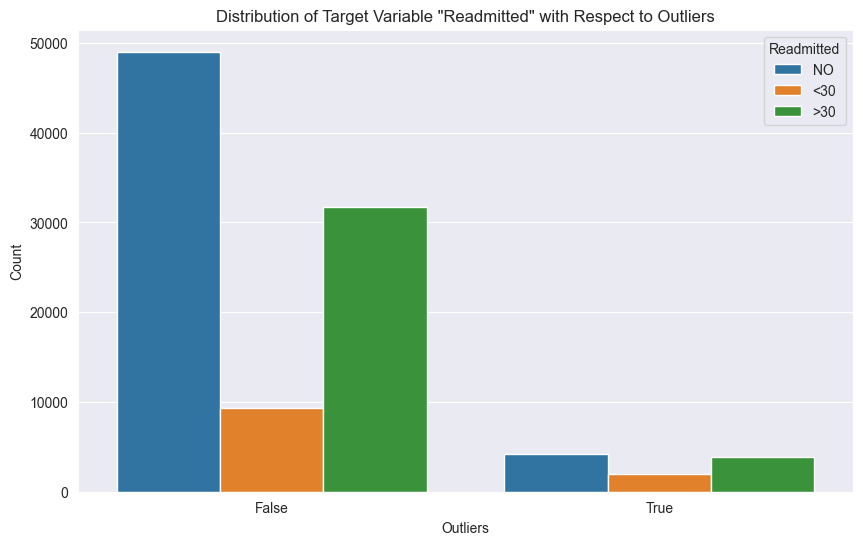

In [ ]:
# Create an alternative bar plot to visualize the distribution of 'readmitted' with respect to outliers
plt.figure(figsize=(10, 6))
sns.set_style("darkgrid")
sns.countplot(
    x="outliers", hue="readmitted", data=diab_df, hue_order=["NO", "<30", ">30"]
)

# Customize the plot
plt.title('Distribution of Target Variable "Readmitted" with Respect to Outliers')
plt.xlabel("Outliers")
plt.ylabel("Count")
plt.legend(title="Readmitted", loc="upper right")

# Show the plot
plt.show()

## **Feature Engineering**

Feature engineering took center stage as categorical columns 'admission_type_id', 'discharge_disposition_id', and  'admission_source_id' were appropriately converted to the 'object' data type. This transformation was achieved using astype('object'). Simultaneously, we addressed the bias that could be introduced by imbalanced features through binarization of highly skewed features as determined during outlier analysis - 'number_outpatient','number_emergency', creating new binary columns - 'outpatient' and 'emergency'. This strategic move not only mitigated the impact of extreme values but also enriched the dataset with binary indicators.

A nuanced approach to handling diagnostic codes ('diag_1', 'diag_2', 'diag_3') was introduced through a mapping function named assign_group. This function categorized ICD-9 codes into broader medical groups according to the mapping instructions that came with the dataset, transcending the numeric nature of codes and providing a semantic layer aligned with clinical intuition. This decision enhanced the interpretability of these features in subsequent analyses.

In [17]:
# Convert specified columns to 'object' type 
diab_df['admission_type_id'] = diab_df['admission_type_id'].astype('object')
diab_df['discharge_disposition_id'] = diab_df['discharge_disposition_id'].astype('object')
diab_df['admission_source_id'] = diab_df['admission_source_id'].astype('object')

In [151]:
# Check the distribution of a potentially highly skewed feature
diab_df['number_inpatient'].value_counts(normalize = True)

number_inpatient
0     0.665961
1     0.191412
2     0.073736
3     0.033172
4     0.015862
5     0.007991
6     0.004765
7     0.002637
8     0.001458
9     0.001109
10    0.000589
11    0.000489
12    0.000340
13    0.000180
14    0.000100
15    0.000090
16    0.000060
19    0.000020
17    0.000010
21    0.000010
18    0.000010
Name: proportion, dtype: float64

In [19]:
# Binarise the highly skewed columns and rename them
diab_df['outpatient'] = np.where(diab_df['number_outpatient']==0,0,1)
diab_df['emergency'] = np.where(diab_df['number_emergency']==0,0,1)
diab_df = diab_df.drop('number_outpatient',axis=1)
diab_df = diab_df.drop('number_emergency',axis=1)


In [20]:
for col in ['diag_1','diag_2','diag_3']:
    # Convert the column to numeric, coercing errors to NaN for values that can't be converted
    diab_df[col] = pd.to_numeric(diab_df[col], errors='coerce')

    # Fill NaN values with the default float value (e.g., -1)
    diab_df[col] = diab_df[col].fillna(float(-1))

In [21]:
def assign_group(code):
    """
    Assign a medical group based on the ICD-9 code.

    Parameters:
      code (int): The ICD-9 code to be categorized.

    Returns:
    str: The medical group corresponding to the provided ICD-9 code.
         Possible groups include 'Circulatory', 'Respiratory', 'Digestive',
         'Diabetes', 'Injury', 'Musculoskeletal', 'Genitourinary', 'Neoplasm',
         or 'Other'.
    """
    if 390 <= code <= 459 or code == 785:
        return "Circulatory"
    elif 460 <= code <= 519 or code == 786:
        return "Respiratory"
    elif 520 <= code <= 579 or code == 787:
        return "Digestive"
    elif 250 <= code < 251:
        return "Diabetes"
    elif 800 <= code <= 999:
        return "Injury"
    elif 710 <= code <= 739:
        return "Musculoskeletal"
    elif 580 <= code <= 629 or code == 788:
        return "Genitourinary"
    elif 140 <= code <= 239:
        return "Neoplasm"
    elif 780 <= code <= 781 or code == 784 or 790 <= code <= 799:
        return "Neoplasm"
    elif 240 <= code <= 279:
        return "Neoplasm"
    elif 680 <= code <= 709 or code == 782:
        return "Neoplasm"
    elif 1 <= code <= 139:
        return "Neoplasm"
    elif 290 <= code <= 319:
        return "Neoplasm"
    else:
        return "Other"


# Apply the function to 'diag_1', 'diag_2', and 'diag_3' columns
diab_df["diag_1"] = diab_df["diag_1"].map(assign_group)
diab_df["diag_2"] = diab_df["diag_2"].map(assign_group)
diab_df["diag_3"] = diab_df["diag_3"].map(assign_group)

In [152]:
diab_df['diag_1'].value_counts()

diag_1
Circulatory        29881
Neoplasm           15934
Respiratory        14074
Digestive           9380
Diabetes            8693
Injury              6881
Other               5273
Genitourinary       5054
Musculoskeletal     4944
Name: count, dtype: int64

# **Dimensionality Reduction**

## **Correlation Analysis**

In the exploration of dimensionality reduction techniques for the diabetes patient dataset, a comprehensive analysis was initiated with correlation analysis. Selecting only numeric columns, a correlation matrix was calculated and visually represented through a heatmap using seaborn. This initial step laid the foundation for understanding the relationships between numerical features, providing insights into potential multicollinearity and guiding subsequent feature selection methods.

Correlation analysis can help identify relationships between numerical features, where high correlations would suggest redundancy, which means that those features may be providing similar information. Redundant features don't necessarily add value to your model and can lead to overfitting, which is why this analysis can help us decide which features to exclude from further modeling.

To perform the analysis, we used the .corr() method, which in our context computes the Pearson correlation coefficient. The correlation coefficient is a normalized measure of the covariance between two variables, calculated as the ratio of their covariance to the product of their standard deviations:

$$r_{X,Y} = \frac{{\text{{cov}}(X,Y)}}{{\text{{sd}}(X) \cdot \text{{sd}}(Y)}}$$
where
- $\text{{sd}}(X) $ is the standard deviation  of X.
- $\text{{sd}}(Y)$ is the standard deviation of Y.
- $\text{{cov}}(X,Y)$ is the covariance.


This normalization ensures that the resulting value always falls within the range of -1 to 1. Similar to covariance, the correlation coefficient specifically captures linear relationships between variables, disregarding various other forms of relationships or correlations. 

A positive value close to 1 indicates a strong positive correlation, meaning that as one variable increases, the other tends to increase as well. Conversely, a negative value close to -1 suggests a strong negative correlation, meaning that as one variable increases, the other tends to decrease. A correlation value close to 0 indicates a weak or no linear relationship.

From the heatmap below, we can see that most features are almost uncorrelated. The highest correlation of 0.46 was found between ‘num_medications and ‘time_in_hospital’, which is still quite insignificant and can be intuitively explained by the fact that people who spent more time in the hospital had more days to receive medications. These small correlations suggest to us that we did not find features with potentially very similar explanatory power, hence we should not immediately discard any features. To better understand the features and their impact, we conducted further statistical analysis.

In [184]:
# Select only the numeric columns for correlation analysis
num_cols_df= diab_df.select_dtypes(include=['number'])

# Calculate the correlation matrix for the numeric columns
correlation_matrix = num_cols_df.corr()

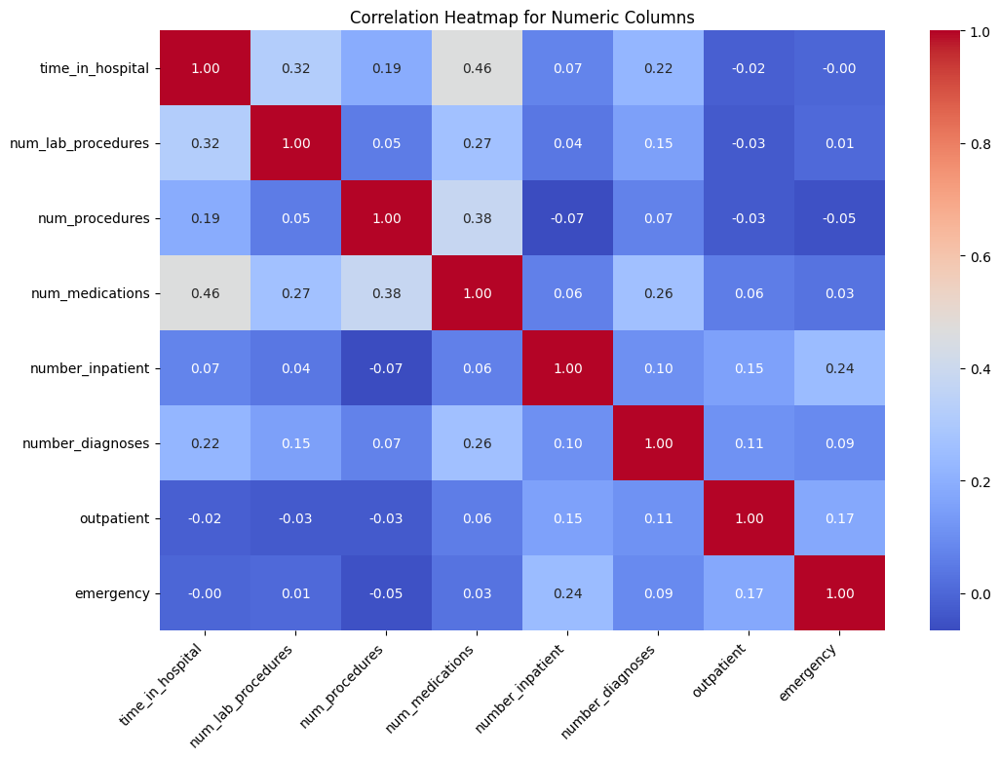

In [185]:
# Create a heatmap
plt.figure(figsize=(12, 8))
heatmap = sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f")

# Rotate x-ticks
heatmap.set_xticklabels(heatmap.get_xticklabels(), rotation=45, ha='right')
plt.title("Correlation Heatmap for Numeric Columns")
plt.show()

## **Chi2 Analysis**

The Chi-squared (χ²) test is a statistical method used to assess the independence of categorical variables in a contingency table. It's a fundamental tool in statistics for detecting associations between variables. The test evaluates whether there is a significant association between two categorical variables by comparing observed frequencies to expected frequencies under the assumption of independence. Chi-squared tests come in two main forms: the Chi-squared test of independence and the Chi-squared goodness-of-fit test. In our project, the focus is on the Chi-squared test of independence. 

The Chi-squared test of independence assesses whether two categorical variables are related or independent. The underlying concept involves constructing a contingency table, which cross-tabulates the two variables to compare observed frequencies to what would be expected if the variables were independent. 

The Chi-squared statistic (in the context of independence) is calculated by taking the squared difference between the observed (O) and expected (E) frequencies for each category, dividing this squared difference by the expected frequency, and summing these contributions for all categories. The result, χ², quantifies the overall discrepancy between observed and expected frequencies:

$$χ² = Σ[\frac{{(O-E)^2}}{{E}}]$$
where
- χ² is the Chi-squared statistic.
- Σ signifies the summation over all categories in the contingency table.
- O represents the observed frequency for each category.
- E represents the expected frequency for each category under the assumption of independence.

Low χ² values indicate that there is little discrepancy between what is observed in the data and what would be expected if the variables were entirely independent. This implies that the variables may not have a strong association. On the other hand, high χ² values indicate that there is a significant departure from independence, suggesting a strong association between the categorical variables. 

In our project, we have undertaken a Chi-squared analysis to select relevant features for predicting hospital readmission among diabetes patients. The Chi-squared test of independence is an appropriate choice for this project, considering that many of the variables in the healthcare domain are categorical. By evaluating the relationship between these categorical features and the target variable (hospital readmission), we aimed to identify the most informative features for our predictive models. 

To prepare the data for this and upcoming tests, ordinal encoding was applied to transform categorical features into numerical representations and LabelEncoder() method was used for the target variable. The average Chi2 results were calculated over multiple iterations to ensure stability and reliability using SelektKBest() method with chi2 scoring function. The resulting Chi-squared values for each feature were then visualized in a bar plot ordered from lowest to highest values features, offering a comprehensive overview of their significance in predicting readmission. Finally, we selected 22 features (half of all features) with the lowest Chi-squared statistic as candidates for deletion.

In [153]:
# Separate the target variable from the features
X = diab_df.drop(columns=['readmitted'])  # Features
y = diab_df['readmitted']  # Target variable

# Format all fields as string
X_str = X.astype(str)

# Encode input data using OrdinalEncoder
def encode_inputs(X):
    oe = OrdinalEncoder()
    oe.fit(X)
    X_enc = oe.transform(X)
    return X_enc


# Encode target variable using LabelEncoder
def encode_targets(y):
    le = LabelEncoder()
    le.fit(y)
    y_enc = le.transform(y)
    return y_enc

In [154]:
# Transform X
X_enc = encode_inputs(X_str)

# Transform y
y_enc = encode_targets(y)

In [155]:
# Apply Chi2 using SelectKBest
def skb_chi2(X, y):
    fs = SelectKBest(score_func=chi2, k='all')
    fs.fit(X, y)
    return fs

In [156]:
results_scores =[]

# Get the average Chi2 results
for i in range(100):
    results = skb_chi2(X_enc, y_enc)
    results_scores.append(results.scores_)

skb_chi2_results = np.mean(results_scores,axis=0)   

In [157]:
# Print all the Chi2 values for all features
for i in range(len(skb_chi2_results)):
    print(f"Feature {X.columns[i]}: {skb_chi2_results[i]}")

# Visualize the Chi2 values for each feature on a log scale in ascending order
fig = px.bar(x=X.columns, y=skb_chi2_results, log_y=True)
fig.update_layout(
    xaxis={"categoryorder": "total ascending"},
    title="Chi-squared values for all features and 'readmitted' target variable",
    yaxis_title="Chi2 (Log10 scale)",
    xaxis_title="Features",
)
fig.update_xaxes(tickangle=-45)

Feature race: 0.5281485132902474
Feature gender: 17.701684662893282
Feature age: 65.01704411327704
Feature admission_type_id: 36.05268576452682
Feature discharge_disposition_id: 6845.741609933168
Feature admission_source_id: 1072.4761047576173
Feature time_in_hospital: 587.0374213661348
Feature num_lab_procedures: 1632.573002136673
Feature num_procedures: 365.0341639629835
Feature num_medications: 7902.297485564031
Feature number_inpatient: 51410.2548124213
Feature diag_1: 88.63384777128523
Feature diag_2: 6.55471909676412
Feature diag_3: 44.77728023989551
Feature number_diagnoses: 430.3448154281143
Feature max_glu_serum: 1.2102526606666404
Feature A1Cresult: 0.8699059498732272
Feature metformin: 20.701645825753932
Feature repaglinide: 0.68180584690846
Feature nateglinide: 0.01269724862147374
Feature chlorpropamide: 0.00392414800468605
Feature glimepiride: 0.4235187670503276
Feature acetohexamide: 1.8165424110286488
Feature glipizide: 2.3302601308542723
Feature glyburide: 0.77295372703

In [158]:
# Create a temporary DataFrame to store the results
chi2_results_df = pd.DataFrame(
    {"Feature": X.columns, "Chi-squared Statistic": skb_chi2_results}
)

# Sort rows by the Chi2 values in ascending order
chi2_results_df_sorted = chi2_results_df.sort_values(
    by="Chi-squared Statistic", ascending=True
)

# Select 22 features (half of the total number of features) with lowest Chi2
cols_to_drop_chi2 = list(chi2_results_df_sorted[:22]["Feature"])
cols_to_drop_chi2

['miglitol',
 'chlorpropamide',
 'glyburide-metformin',
 'nateglinide',
 'acarbose',
 'glimepiride',
 'race',
 'repaglinide',
 'glyburide',
 'insulin',
 'A1Cresult',
 'metformin-pioglitazone',
 'tolbutamide',
 'rosiglitazone',
 'max_glu_serum',
 'pioglitazone',
 'troglitazone',
 'metformin-rosiglitazone',
 'acetohexamide',
 'glimepiride-pioglitazone',
 'glipizide-metformin',
 'tolazamide']

## **Mutual Information Analysis**

Next, we proceeded with the Mutual Information (MI) analysis, leveraging SelectKBest with mutual_info_classif as the scoring function. Similar to Chi2 analysis, the process involved multiple iterations to obtain robust average MI scores. 

Mutual Information (MI) is a statistical measure rooted in information theory, employed to quantify the relationship between two random variables. MI gauges the amount of information one variable carries about the other. In the context of feature selection, MI assesses the mutual dependence between features and a target variable. The core formula for calculating MI between two discrete random variables X and Y is as follows:

$$I(X;Y) = Σ_xΣ_yP(x,y) \cdot log(\frac{{P(x,y)}}{{P(x)P(y)}})$$
where
- I(X;Y) represents the Mutual Information between variables X and Y.
- P(x,y) denotes the joint probability distribution of X and Y.
- P(x) and P(y) are the marginal probability distributions of X and Y, respectively.

When the MI between two variables is high, it suggests a strong relationship or dependence. In the context of feature selection, a feature with high MI with the target variable is indicative of its substantial influence on the prediction task. Conversely, when the MI between variables is low, it implies a weak or negligible relationship. In feature selection, a feature with low MI with the target variable does not contribute much information for prediction.

In our project, we have employed MIA to evaluate the association between the features and the target variable, 'readmitted.' One of the advantages of MI is the ability to effectively capture the dependencies between variables, whether they are categorical or numerical. Also, MI, unlike some simpler feature selection methods, can capture complex and non-linear interactions between features, which is invaluable in the context of our multi-feature dataset.

As a result of our implementation, feature importance scores were extracted and visualized as a bar plot in ascending order to discern the relevance of each feature in predicting readmission. As before, we selected 22 features with the lowest MI as elimination candidates.

In [159]:
# Apply MI using SelectKBest
def skb_mut_inf(X, y):
    fs = SelectKBest(score_func=mutual_info_classif, k='all')
    fs.fit(X, y)
    return fs

In [160]:
results_scores =[]

# Get the avergae MI results
for i in range(10):
    results = skb_mut_inf(X_enc, y_enc)
    results_scores.append(results.scores_)

skb_mi_results = np.mean(results_scores,axis=0)  

In [161]:
# Show the scores for the features
for i in range(len(skb_mi_results)):
    print(f"Feature {X.columns[i]}: {skb_mi_results[i]}")

# Visualize the MI values for each feature in ascending order
fig = px.bar(x=X.columns, y=skb_mi_results)
fig.update_layout(
    xaxis={"categoryorder": "total ascending"},
    title="MI values for all features and 'readmitted' target variable",
    yaxis_title="Mutual information",
    xaxis_title="Features",
)
fig.update_xaxes(tickangle=-45)

Feature race: 0.008375501348884762
Feature gender: 0.0055874419205451
Feature age: 0.00348118946630398
Feature admission_type_id: 0.0028362253219980094
Feature discharge_disposition_id: 0.011059372116163368
Feature admission_source_id: 0.011868427005618697
Feature time_in_hospital: 0.003000527509213602
Feature num_lab_procedures: 0.0023407653090836257
Feature num_procedures: 0.0026519259345463954
Feature num_medications: 0.004820145862248859
Feature number_inpatient: 0.03266971596024302
Feature diag_1: 0.0029175860790915387
Feature diag_2: 0.002551950230757738
Feature diag_3: 0.0031018470836025047
Feature number_diagnoses: 0.00980637594185112
Feature max_glu_serum: 0.008174680136461521
Feature A1Cresult: 0.005298547622204208
Feature metformin: 0.00668850290940548
Feature repaglinide: 0.007341003045290795
Feature nateglinide: 0.009177054069234237
Feature chlorpropamide: 0.006761404279677552
Feature glimepiride: 0.01162764591841885
Feature acetohexamide: 0.0008876654061656941
Feature gli

In [162]:
# Create a temporary DataFrame to store the results
mi_results_df = pd.DataFrame({"Feature": X.columns, "MI Statistic": skb_mi_results})

# Sort rows by the MI values in ascending order
mi_results_df_sorted = mi_results_df.sort_values(by="MI Statistic", ascending=True)

# Select 22 features (to match the size of the previous result) with lowest MI
cols_to_drop_mi = list(mi_results_df_sorted[:22]["Feature"])
cols_to_drop_mi

['metformin-pioglitazone',
 'troglitazone',
 'tolbutamide',
 'metformin-rosiglitazone',
 'glimepiride-pioglitazone',
 'acetohexamide',
 'tolazamide',
 'glipizide-metformin',
 'num_lab_procedures',
 'diag_2',
 'num_procedures',
 'admission_type_id',
 'diag_1',
 'time_in_hospital',
 'diag_3',
 'age',
 'outliers',
 'num_medications',
 'A1Cresult',
 'gender',
 'rosiglitazone',
 'outpatient']

## **ANOVA F-test Analysis**

ANOVA F-test analysis was used as another feature selection method. 

This analytical tool examines the variance between groups of different feature categories, helping us uncover those attributes that exhibit the most pronounced disparities in relation to hospital readmission. 

At its core, the ANOVA f-test is a statistical technique that aims to assess whether there are significant differences between the means of multiple categories, which in our case means finding whether there are statistically significant differences in the mean readmission rates among the groups within each feature. For instance, applying the test to the ‘age’ feature, we can assess if different age groups, such as [0-10], [11-20], [21-30], and so on, exhibit significantly different readmission patterns (not readmitted, readmitted within 30 days from release, or more than 30 days after release).

The choice of the ANOVA F-test aligns seamlessly with our project goals. Its versatility accommodates the mixed nature of our dataset, offering insights into both numerical and categorical attributes, as well as allowing for multigroup comparisons within each feature.

When we conducted the ANOVA F-test, we obtained an F-statistic, which quantifies the ratio of the variation between group means to the variation within groups:
$$ F = \frac{{\text{{Variance between features}}}}{{\text{{Variance within features}} }}$$
where 
 - The variation between groups is calculated as the mean squared difference between the group means: $\frac{{Σ_{i=1}^Kn_i(\mu_i-\mu)^2}}{{K-1}}$, where $\mu_i$ is the sample mean in the i-th feature, $n_i$ is the number of observations in the i-th feature, $\mu$ denotes the overall mean of the data, and K is the total number of features in the dataset.
 - The variation within groups is calculated as the mean squared difference between individual data points and their respective group means: $\frac{{Σ_{i=1}^K \cdot Σ_{j=1}^{n_j} \cdot n_i(\mu_{ij}-\mu_i)^2}}{{N-K}}$, where $\mu_i$ is the sample mean in the i-th feature, $\mu_{ij}$  denotes the j-th observation within i-th feature, K is the total number of features in the dataset, and N is the total number of observations.

Mathematically, the F-statistic follows an F-distribution, which is a probability distribution that depends on two degrees of freedom: one for the numerator (between-feature variation) and one for the denominator (within-feature variation).

In the context of your dataset, a high F-value indicates that there are significant differences in readmission rates among the groups within the feature. In other words, that feature has a noteworthy impact on hospital readmission. Conversely, a low F-value suggests that there are no substantial differences among the groups within that feature, indicating that this particular category does not significantly influence readmission patterns.


Employing SelectKBest with f_classif, the average F-test scores were calculated over numerous iterations and showcased in a bar plot, aiding in the identification of features contributing significantly to the prediction of readmission. Once again, we selected 22 features with the lowest F-score.

In [163]:
# Apply F-test using SelectKBest
def skb_anova_f(X, y):
    fs = SelectKBest(score_func=f_classif, k='all')
    fs.fit(X, y)
    return fs

In [164]:
results_scores =[]

# Get the average F-test results
for i in range(100):
    results = skb_anova_f(X_enc, y_enc)
    results_scores.append(results.scores_)

skb_anova_f_results = np.mean(results_scores,axis=0)    

In [165]:
# Show the scores for the features
for i in range(len(skb_anova_f_results)):
    print(f"Feature {X.columns[i]}: {skb_anova_f_results[i]}")

# Visualize the ANOVA f-test values for each feature in ascending order
fig = px.bar(x=X.columns, y=skb_anova_f_results)
fig.update_layout(
    xaxis={"categoryorder": "total ascending"},
    title="ANOVA f-test values for all features and 'readmitted' target variable",
    yaxis_title="ANOVA f-test values",
    xaxis_title="Features",
)
fig.update_xaxes(tickangle=-45)

Feature race: 0.603429611808593
Feature gender: 16.4533451693701
Feature age: 77.87664089701343
Feature admission_type_id: 8.866441436918869
Feature discharge_disposition_id: 333.59206271197405
Feature admission_source_id: 123.07264327645558
Feature time_in_hospital: 154.5059357708724
Feature num_lab_procedures: 97.27977794061859
Feature num_procedures: 84.15274849521303
Feature num_medications: 152.5346193242675
Feature number_inpatient: 2596.289382138493
Feature diag_1: 16.67717296339622
Feature diag_2: 1.179609621917958
Feature diag_3: 8.089711843407487
Feature number_diagnoses: 711.7874501720363
Feature max_glu_serum: 12.6322454784256
Feature A1Cresult: 3.0443840791944354
Feature metformin: 64.81334978402354
Feature repaglinide: 18.943103700490553
Feature nateglinide: 0.8397361052825636
Feature chlorpropamide: 1.9102762501918298
Feature glimepiride: 3.801220871662339
Feature acetohexamide: 0.9082695410722674
Feature glipizide: 9.770216563835532
Feature glyburide: 3.573856396143795


In [166]:
# Create a temporary DataFrame to store the results
anova_f_results_df = pd.DataFrame(
    {"Feature": X.columns, "ANOVA f-test Statistic": skb_anova_f_results}
)

# Sort rows by the F values in ascending order
anova_f_results_df_sorted = anova_f_results_df.sort_values(
    by="ANOVA f-test Statistic", ascending=True
)

# Select 22 features (to match the size of the previous result) with lowest F values
cols_to_drop_anova_f = list(anova_f_results_df_sorted[:22]["Feature"])
cols_to_drop_anova_f

['metformin-pioglitazone',
 'glyburide-metformin',
 'tolbutamide',
 'race',
 'troglitazone',
 'insulin',
 'nateglinide',
 'metformin-rosiglitazone',
 'glimepiride-pioglitazone',
 'acetohexamide',
 'glipizide-metformin',
 'tolazamide',
 'diag_2',
 'miglitol',
 'chlorpropamide',
 'A1Cresult',
 'glyburide',
 'glimepiride',
 'diag_3',
 'admission_type_id',
 'pioglitazone',
 'glipizide']

## **Recursive Feature Elimination (RFE)**

We also applied a more sophisticated wrapper technique - Recursive Feature Elimination (RFE) - to systematically remove less important features. 

RFE is a powerful feature selection technique that iteratively refines the set of features using a predictive model. Initially, the full feature set is considered, and the selected model is trained. The importance of each feature is evaluated, and the least influential ones are pruned. The process iterates, systematically paring down the features until the desired number or the most informative subset is achieved. By intertwining with the model training process, RFE captures intricate relationships and dependencies among features, providing a nuanced understanding of their collective impact on predictive performance.

Our implementation employs RFE with a Random Forest classifier, harnessing the power of tree-based models to uncover complex feature interactions. The importance of a feature in a Random Forest model is measured by the mean decrease in Gini impurity when the feature is used for splitting nodes in the trees. For each tree in the forest, the contribution of each feature to the impurity decrease is calculated, and the average across all trees provides the feature importance.

The feature importance $I_j$ for feature j is given as:
$$ I_j = \frac{{Σ_{t=1}^T \cdot I_{jt}}}{{T}} $$
where
 - $I_{jt}$ is the impurity decrease for feature j in tree t.
 - T is the total number of trees in the Random Forest.

After iteratively fitting RFE with RF, the resulting feature importances were visualized through a bar chart, providing a clear ranking of features based on their importance. The output of the algorithm was a list of least important 22 features.

In [167]:
def rfe_fs(X, y, col_names, estimator, k):
    """
    Perform Recursive Feature Elimination (RFE) for feature selection.

    Parameters:
      X (array-like or pd.DataFrame): The feature matrix.
      y (array-like or pd.Series): The target variable.
      col_names (list): List of column names corresponding to the features in X.
      estimator: The external estimator object that assigns weights to features.
      k (int): The number of features to select.

    Returns:
      selector (RFE): The trained RFE selector.
      deleted_features (list): List of column names to be deleted (least important features).
      feature_importances (pd.DataFrame): DataFrame containing feature importances.
    """
    # Initialize RFE with the estimator and the number of features to select
    selector = RFE(estimator, n_features_to_select=k)

    # Fit RFE to the dataset with a progress bar
    with tqdm(total=k, desc="RFE Progress") as pbar:
        for step in range(k):
            selector.fit(X, y)
            # Update the progress bar
            pbar.update(1)

    # Get the list of columns to delete (least important features)
    deleted_features = col_names[~selector.support_]

    # Create a DataFrame of feature importances
    feature_importances = pd.DataFrame(
        {"Feature": col_names, "Importance": selector.ranking_}
    )

    # Sort the DataFrame by importance (ascending order) to arrange features from least important to most important
    feature_importances = feature_importances.sort_values(
        by="Importance", ascending=True
    )

    return selector, deleted_features, feature_importances

In [168]:
rfe_model, cols_to_drop_rfe, rfe_results_df = rfe_fs(
    X_enc, y_enc, X.columns, estimator=RandomForestClassifier(), k=22
)

RFE Progress: 100%|██████████| 22/22 [2:37:14<00:00, 428.82s/it]  


In [169]:
# Create a bar chart to visualize RFE feature ranks
fig = px.bar(rfe_results_df, x="Feature", y="Importance")
fig.update_layout(
    title="Feature Importances (RFE)",
    yaxis_title="Importance",
    xaxis_title="Features",
    xaxis={
        "categoryorder": "total descending"
    },  # Arrange features from least to most important
)
fig.update_xaxes(tickangle=-45)
fig.show()

# Print the list of deleted feature names
print("Features to drop:")
print(cols_to_drop_rfe)

Features to drop:
Index(['max_glu_serum', 'repaglinide', 'nateglinide', 'chlorpropamide',
       'glimepiride', 'acetohexamide', 'tolbutamide', 'rosiglitazone',
       'acarbose', 'miglitol', 'troglitazone', 'tolazamide',
       'glyburide-metformin', 'glipizide-metformin',
       'glimepiride-pioglitazone', 'metformin-rosiglitazone',
       'metformin-pioglitazone', 'diabetesMed', 'outliers', 'outpatient',
       'emergency'],
      dtype='object')


## **Lasso**

Lastly, Lasso regression was applied to identify and eliminate features with coefficients equal to zero. 

Lasso Regression is an extension of linear regression with regularization which introduces sparcity to the data and helps prevent overfitting.

Lasso's foundation lies in modifying the standard linear regression cost function by adding a regularization term. The cost function, $J(θ)$, is defined as the sum of squared errors between the predicted and actual values, augmented by a regularization term:
$$J(θ) = \frac{{1}}{{m}} \cdot Σ_{i=1}^m(f_θ(x_i) - y_i)^2 + λΣ_{j=1}^n|θ_j| $$
where
- m is the number of training examples.
- $f_θ(x_i)$ is the predicted value for the i-th example.
- $y_i$ is the actual output.
- n is the number of features.
- θ_j are the regression coefficients
- λ is the regularization parameter.

The regularization term, $λΣ_{j=1}^n|θ_j|$ penalizes the absolute values of the coefficients, encouraging small coefficients, preventing overfitting, and promoting a more generalized model. This term encourages sparsity by driving some coefficients to zero, effectively performing feature selection.

The goal is of the algorithm is to minimize the cost function, J(θ), which balances the fit to the training data and the regularization term. The regularization parameter λ controls the trade-off between these two objectives.

Before we implemented Lasso, the features were scaled using StandardScaler to ensure the regularization term's effectiveness since Lasso is sensitive to the scale of features. GridSearchCV was employed for hyperparameter tuning to find the optimal value for the regularization parameter λ, and the best Lasso model was utilized to obtain feature importances. The importance of each feature was visualized in a bar chart, aiding in the identification of critical features. The output was the list of features which coefficients were set to zero during Lasso training. These are the candidates for elimination.

In [ ]:
scaler = StandardScaler()

X_scaled = scaler.fit_transform(X_enc)

In [ ]:
def lasso_fs(X, y, col_names, params, n_splits):
    """
    Perform feature selection using Lasso regression.

    Parameters:
      X (pd.DataFrame): The feature matrix.
      y (pd.Series): The target variable.
      col_names (list): List of column names in the feature matrix.
      params (dict): Dictionary of hyperparameters for Lasso regression.
      n_splits (int): Number of folds for cross-validation.

    Returns:
    tuple: A tuple containing the Lasso model, DataFrame with feature importances,
           and a list of excluded feature names (least important features).
    """

    # Number of Folds and adding the random state for replication
    kf = KFold(n_splits=n_splits, shuffle=True, random_state=42)

    # Initializing the Model
    model = Lasso(max_iter=1000)

    # GridSearchCV with model, params and folds.
    lasso_gs = GridSearchCV(model, param_grid=params, cv=kf)
    lasso_gs.fit(X, y)

    # Fit the model with the optimal parameters
    lasso = Lasso(alpha=lasso_gs.best_params_["alpha"], max_iter=1000)

    lasso.fit(X_enc, y_enc)

    # Get the coefficients (feature importances)
    feature_importances = np.abs(lasso.coef_)

    # Create a DataFrame to store the feature importances
    feature_importances_df = pd.DataFrame(
        {"Feature": col_names, "Importance": feature_importances}
    )

    # Sort the DataFrame by importance (ascending order) to arrange features from less important to most important
    feature_importances_df = feature_importances_df.sort_values(
        by="Importance", ascending=True
    )

    # Get the list of columns to exclude (least important features)
    excluded_feature_names = feature_importances_df[
        feature_importances_df["Importance"] == 0
    ]["Feature"]

    return lasso, feature_importances_df, list(excluded_feature_names)

In [ ]:
# parameters to be tested on GridSearchCV
params = {"alpha":np.arange(0.00001, 10, 500)}

# Perform Lasso Regression and extract the fetures with coefficients of 0
lasso_model, lasso_results_df , cols_to_drop_lasso = lasso_fs(X_scaled, y_enc, col_names=X.columns,params=params,n_splits=10)

In [ ]:
# Create a bar chart to visualize feature importances
fig = px.bar(lasso_results_df, x="Feature", y="Importance")
fig.update_layout(
    title="Feature Importances (Lasso)",
    yaxis_title="Importance",
    xaxis_title="Features",
    xaxis={
        "categoryorder": "total ascending"
    },  # Arrange features from less important to most important
)
fig.update_xaxes(tickangle=-45)
fig.show()

# Print the list of deleted feature names
print("Features to drop:")
print(cols_to_drop_lasso)

Features to drop:
['metformin-pioglitazone', 'acetohexamide', 'chlorpropamide', 'glipizide-metformin', 'glimepiride-pioglitazone', 'troglitazone']


## **Overall Result Across Methods**

To consolidate results across all methods, we created a DataFrame to track features selected for removal by each technique. A 'Matches' column counted how many times each feature was identified for removal across all applied methods. Features selected by the RFE methd and at least three times in total were considered for removal, and the final dataset was obtained by dropping these features. The threshold of three mathces is somewhat arbitrary with the reasoning being that if more than half of the methods (3 out of 5) identified the feature for elimination, then we can be relatively confident that this feature does not carry enough usefull information. Also, we selected only the feature identified by the RFE to emphasize the importance of this algorithm as it is considered to be the most robust and informative (due to the use and training of Random Forest) among all algorithms employed.

In [ ]:
# Create a temporary DataFrame to store the results for this column
fs_total_results_df = pd.DataFrame(
    {
        "Feature": X.columns,
        "Chi2": [True if x in cols_to_drop_chi2 else False for x in X.columns],
        "MI": [True if x in cols_to_drop_mi else False for x in X.columns],
        "ANOVA_f-test": [
            True if x in cols_to_drop_anova_f else False for x in X.columns
        ],
        "RFE": [True if x in cols_to_drop_rfe else False for x in X.columns],
        "Lasso": [True if x in cols_to_drop_lasso else False for x in X.columns],
    }
)

In [ ]:
# Count how many times each feature was selected across all applied methods, store in 'Matches'
fs_total_results_df['Matches'] = fs_total_results_df.iloc[:,1:].sum(axis=1)

In [ ]:
fs_total_results_df

,Feature,Chi2,MI,ANOVA_f-test,RFE,Lasso,Matches
0,race,True,False,True,False,False,2
1,gender,False,True,False,False,False,1
2,age,False,True,False,False,False,1
3,admission_type_id,False,True,True,False,False,2
4,discharge_disposition_id,False,False,False,False,False,0
5,admission_source_id,False,False,False,False,False,0
6,time_in_hospital,False,True,False,False,False,1
7,num_lab_procedures,False,True,False,False,False,1
8,num_procedures,False,True,False,False,False,1
9,num_medications,False,True,False,False,False,1


In [ ]:
# Select features that were selected at least 4 times
cols_to_drop = fs_total_results_df[(fs_total_results_df['Matches']>=3)&(fs_total_results_df['RFE']==True)]['Feature']

In [ ]:
cols_to_drop

19                 nateglinide
20              chlorpropamide
21                 glimepiride
22               acetohexamide
25                 tolbutamide
27               rosiglitazone
29                    miglitol
30                troglitazone
31                  tolazamide
33         glyburide-metformin
34         glipizide-metformin
35    glimepiride-pioglitazone
36     metformin-rosiglitazone
37      metformin-pioglitazone
Name: Feature, dtype: object

In [ ]:
# Drop the identified features
diab_df_filtered = diab_df.drop(columns = cols_to_drop)

# **ML Models Implementation and Evaluation**

The implementation and evaluation of machine learning models on the preprocessed diabetes patient dataset involved several crucial steps. Initially, column encoding was performed to prepare the data for model training. This step included one-hot encoding for categorical columns, ordinal encoding (OrdinalEncoder()) for specific columns "age" and "outliers.", as well as label encoding (LabelEncoder()) for the tagret variable 'readmitted'. The ColumnTransformer was employed to facilitate this process, ensuring the proper transformation of the dataset.

One-hot encoding is an appropriate choice for categorical columns as it converts each category into a binary vector, creating new binary columns for each category. This approach prevents the model from assuming ordinal relationships between categories, ensuring a more accurate representation of categorical variables.

Ordinal encoding is suitable for preserving the ordinal relationships between categories. For example, in the "age" column, ordinal encoding ensures that the model understands the increasing order of age groups. In the 'outlier' case, however, ordinal encoding means simply converting True and False into 0 and 1. 

Label encoding is a special case of ordinal encoding designed specifically for the target variables. In our case, it converts classes 'NO', '<30', and '>30' into integers 0, 1, and 2.

## **Encoding**

In [25]:
# Store column names
col_names = diab_df_filtered.columns
col_names

Index(['race', 'gender', 'age', 'admission_type_id',
       'discharge_disposition_id', 'admission_source_id', 'time_in_hospital',
       'num_lab_procedures', 'num_procedures', 'num_medications',
       'number_inpatient', 'diag_1', 'diag_2', 'diag_3', 'number_diagnoses',
       'max_glu_serum', 'A1Cresult', 'metformin', 'repaglinide', 'glipizide',
       'glyburide', 'pioglitazone', 'acarbose', 'insulin', 'change',
       'diabetesMed', 'readmitted', 'outliers', 'outpatient', 'emergency'],
      dtype='object')

In [26]:
# Define which columns should be one-hot encoded or ordinal encoded
one_hot_columns = [
    "race",
    "gender",
    "admission_type_id",
    "discharge_disposition_id",
    "admission_source_id",
    "diag_1",
    "diag_2",
    "diag_3",
    "max_glu_serum",
    "A1Cresult",
    "metformin",
    "repaglinide",
    "glipizide",
    "glyburide",
    "pioglitazone",
    "acarbose",
    "insulin",
    "change",
    "diabetesMed",
    "outpatient",
    "emergency",
]
ordinal_columns = ["age", "outliers"]

# Create column transformer
preprocessor = ColumnTransformer(
    transformers=[
        (
            "onehot",
            OneHotEncoder(sparse_output=False, feature_name_combiner="concat"),
            one_hot_columns,
        ),
        ("ordinal", OrdinalEncoder(), ordinal_columns),
    ],
    remainder="passthrough",  # Pass through columns not specified for encoding
)

# Apply the preprocessor to the data and convert it back to a dataframe with proper feature names
diab_df_filtered = preprocessor.fit_transform(diab_df_filtered)
diab_df_filtered = pd.DataFrame(
    diab_df_filtered, columns=preprocessor.get_feature_names_out(col_names)
)

In [27]:
# Remove prefixes ending with '__'
diab_df_filtered.columns = [col.split('__')[-1] if '__' in col else col for col in diab_df_filtered.columns]

In [28]:
diab_df_filtered

,race_AfricanAmerican,race_Asian,race_Caucasian,race_Hispanic,race_Other,gender_Female,gender_Male,gender_Unknown/Invalid,admission_type_id_1,admission_type_id_2,...,emergency_1,age,outliers,time_in_hospital,num_lab_procedures,num_procedures,num_medications,number_inpatient,number_diagnoses,readmitted
0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,1.0,1,41,0,1,0,1,NO
1,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,...,0.0,1.0,0.0,3,59,0,18,0,9,>30
2,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,...,0.0,2.0,0.0,2,11,5,13,1,6,NO
3,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,...,0.0,3.0,0.0,2,44,1,16,0,7,NO
4,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,...,0.0,4.0,0.0,1,51,0,8,0,5,NO
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
100109,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,...,0.0,7.0,0.0,3,51,0,16,0,9,>30
100110,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,...,0.0,8.0,0.0,5,33,3,18,1,9,NO
100111,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,...,0.0,7.0,0.0,1,53,0,9,0,13,NO
100112,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,...,0.0,8.0,0.0,10,45,2,21,1,9,NO


In [29]:
diab_df_filtered['readmitted'].value_counts()

readmitted
NO     53212
>30    35545
<30    11357
Name: count, dtype: int64

## **Transforming and Splitting**

The next steps involved scaling , splitting the dataset, and balancing. First, the data was split into training and test sets, with 80% used for training and 20% for testing and stratified by the target labels to ensure both train and test sets contain the same proportions of the target classes for better model training and performance. After splitting, StandardScaler() was fit on and applied to the train data to normalize the feature values, ensuring consistent scales across different features. Then, it was also applied to transform the test data.

After the inspection of 'readmitted', we can see that it is quite imbalancd : ~53000 for 'NO', ~35000 for '>30', and ~11000 for '<30>' in the original dataset. To address this issue, the dataset was somewhat augmented and balanced using the Synthetic Minority Over-sampling Technique (SMOTE), specifically SMOTETomek variant. This resampling technique generated synthetic samples for the minority class, enhancing the model's ability to learn from the underrepresented class. 

Specifically, SMOTE works by creating synthetic examples of the minority class by interpolating between existing instances. For each minority class instance, SMOTE generates synthetic instances by considering its k nearest neighbors and creating new instances along the line segments connecting the original instance to its neighbors.Tomek links are pairs of instances, one from the majority class and one from the minority class, that are close to each other. These pairs are identified based on their distances. The idea is to remove instances from the majority class that are close to the decision boundary, making the classification task easier. Overall, The SMOTETomek algorithm combines the two techniques. It starts by applying SMOTE to oversample the minority class, creating synthetic instances.

In [138]:
scaler = StandardScaler()

# New encoded features
X_enc = diab_df_filtered.drop(columns=["readmitted"])
# Transform y
y_enc = encode_targets(diab_df_filtered['readmitted'])

# Resampling the minority class
sm = SMOTETomek(sampling_strategy='minority')

# Fit the model to generate the data.
X_enc, y_enc = sm.fit_resample(X_enc, y_enc)

# Split the data into training and test sets
X_train, X_test, y_train, y_test = train_test_split(X_enc, y_enc , test_size=0.2, random_state=42, stratify=y_enc)

# Scale the data
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

## **Random Forest** 

The Random Forest model was chosen as the first machine learning model for implementation. Hyperparameter tuning was conducted using grid search with stratified 10-fold cross-validation. The grid search explored combinations of parameters, such as the number of estimators and the maximum depth of trees. The best hyperparameters were then used to train the Random Forest model, which was subsequently evaluated on the test set. The evaluation metrics included accuracy, precision, recall, F1 score, and ROC-AUC. The confusion matrix and ROC-AUC curves were visualized to provide a comprehensive understanding of the model's performance.

Specifically, during cross-validation, we divided the training set into 10 folds, fitting the model to different combinations of nine folds and testing on the remaining one. Given the number of folds, the fitting was repeated 10 times. To get the final performance result, the average of the 10 test results across 10 folds was taken. This technique was introduced to mitigate the bias that could have been introduced by splitting the data in one certain way and help prevent overfitting. By splitting it in 10 different ways, we ensured that the model doesn't learn only the features specific to the small subset of data it was trained on but becomes more generalizable by being fitted to and tested on five variable subsets of data. This technique was implemented using KFold() method from sklearn.

In addition to cross-validation, we applied the grid search technique using sklearn's GridSearchCV() method for hyperparameters tuning. We waere trying out different 'n_estimators' (the number of decision trees to include) and 'max_depth' (maximum depth of the decision tree) parameters for Random Forest to see which combination leads to highest performance metric.

The n_estimators parameter determines the number of decision trees (or estimators) to be included in the Random Forest. Increasing the value of n_estimators generally leads to a more robust and accurate model, as it reduces the impact of individual noisy trees. However, a trade-off exists because a larger number of trees may increase the computational cost and training time.
It's important to note that adding more trees will not necessarily lead to overfitting in a Random Forest, unlike individual decision trees. The max_depth parameter controls the maximum depth or the maximum number of levels in each decision tree within the Random Forest. It limits how deep each tree can grow during training. A tree's depth represents how many splits it can make before making a final prediction. A smaller value of max_depth limits the complexity of individual trees and makes them more shallow. Shallow trees tend to capture simpler patterns in the data and are less likely to overfit, making the Random Forest more robust against noise in the data. Conversely, a larger value of max_depth makes trees deeper and more complex. This can lead to overfitting, especially if the dataset is small or noisy. However, deeper trees can capture more intricate relationships in the data.

We used the weighted f-1 score to track each model's performance during cross-validation and grid search. The main reason for that is a higher vulnerability of such metrics as accuracy or precision to my imbalanced dataset, while f-1 is a more robust metric in this case. In my case, neither Type 1 error nor Type 2 error takes precedence, and there is no clear need to prioritize precision over recall or vice versa. F-1 score, which harmonizes precision and recall, emerges as a suitable metric for 'readmitted' category classification. By optimizing for F-1 score, my goal was to achieve a balanced compromise between precision and recall across all 'readmitted' categories. This approach enhances the model's capability to deliver accurate and robust predictions in the context of this multi-class classification scenario.

Now, let's delve deeper into the inner working of RF.

<p>A Random Forest consists of an ensemble of decision trees. Each tree in the forest contributes to the final classification decision. This ensemble approach helps improve accuracy and robustness.</p>

<p>Random Forest starts by creating multiple bootstrap samples (randomly selected subsets with replacement) from the original training data. Each decision tree is trained on one of these bootstrap samples, introducing diversity into the ensemble.</p>

<p>Each decision tree in the Random Forest is constructed as follows:</p>

<ol>
  <li><strong>Feature Selection:</strong> At each node of the tree, a random subset of features is considered for splitting. This randomness helps ensure that individual trees are different from each other.</li>
  <li><strong>Splitting:</strong> The tree splits nodes based on the selected feature that provides the best separation of data using splitting criteria such as Gini impurity and entropy.</li>
  <li><strong>Tree Depth:</strong> Decision trees are grown until a predefined maximum depth is reached or until further splitting does not improve the node's purity.</li>
</ol>

<p>For classification tasks, each decision tree in the Random Forest casts a vote to predict the class of a data point. The class that receives the majority of votes from the trees becomes the final prediction. In my case, the classes represent the three 'readmitted' categories.</p>

<p>Random Forest excels in providing robust and accurate predictions. By aggregating the decisions of multiple trees, it reduces the risk of overfitting and handles noisy data effectively. Additionally, it provides valuable insights into feature importance, which can be helpful in understanding which features are most influential in the classification process.</p>

<p>While Random Forest primarily involves the ensemble of decision trees, the key mathematical concept often used in decision tree splitting is the Gini impurity:</p>

<p>The Gini impurity for a dataset D with C classes is defined as:</p>

$$
\text{Gini}(D) = 1 - \sum_{k=1}^{C} (p_k)^2
$$
where
- $\text{Gini}(D)$ is the Gini impurity for dataset D.
- C is the number of classes (in my case, 4 age categories).
- ${p_k}$ is the proportion of samples in dataset D that belong to class k.


<p>The goal in decision tree splitting is to minimize the Gini impurity by selecting the feature and threshold that result in the purest splits.</p>

### **Model** 

In [143]:
def rf_model(X, y, params, nsplits, scoring_metric):
    """
    Trains a Random Forest model using grid search with stratified k-fold cross-validation.

    Parameters:
      X (pd.DataFrame): The feature matrix.
      y (pd.Series): The target variable.
      params (dict): Hyperparameter grid for grid search.
      nsplits (int): Number of splits for stratified k-fold cross-validation.
      scoring_metric (str): Scoring metric for model evaluation.

    Returns:
      grid_search (GridSearchCV): Grid search object containing the results.
      best_rf_model (RandomForestClassifier): Trained Random Forest model with the best hyperparameters.
    """
    # Initialize the model
    model = RandomForestClassifier(random_state=42)

    # Perform grid search with stratified 10-fold cross-validation
    cv = StratifiedKFold(n_splits=nsplits)
    grid_search = GridSearchCV(model, param_grid, cv=cv, scoring=scoring_metric)

    # Fit the model within the loop
    grid_search.fit(X, y)

    # Get the best hyperparameters
    best_params = grid_search.best_params_

    # Train the Random Forest model with the best hyperparameters
    best_rf_model = RandomForestClassifier(**best_params, random_state=42)

    # Fit the model within the loop
    best_rf_model.fit(X, y)

    return grid_search, best_rf_model


# Set up a grid of hyperparameters to search
param_grid = {"n_estimators": [100, 200, 300, 400], "max_depth": [None, 20, 30, 50, 70]}

# Fit the model
rf_gs, best_rf_model = rf_model(
    X_train,
    y_train,
    params=param_grid,
    nsplits=10,
    scoring_metric="f1_weighted",
)

### **Predictions and Evaluation** 

As a result of the grid search, an optimal parameter set of 'max_depth': 50, 'n_estimators': 400 was selected for testing. We computed such metrics as accuracy, recall, precision, f-1 score, and AUC score, as well as visualzied the confusion matrix together with the ROC-AUC curve for each class.

The accuracy score of 0.71 means that only 71% of all data points were classified correctly. The precision score (TP/(TP+FP)) of 0.74 means that only 74% of patients classified as a certain class actually belonged to that class. The recall score (TP/(TP+FN)) of 0.71 means that 71% of patients of a certain class were recognized as that class. F-1 score is a metric that captures the tradeoff between precision and recall (2* Recall *Precision/(Recall+Precision)). It balances both false positives and false negatives. An F1-score of 0.71 indicates that the model achieves a reasonable balance between precision and recall. It suggests that the model can make positive predictions with a certain level of accuracy while correctly identifying a good portion of actual positive cases. However, there is plenty room left for improvement. AUC score of 0.86 means that the model will rank a randomly chosen sample belonging to a certain class more highly than a randomly chosen sample of a different class with a probability of 86%.

From the confusion matrix we can see that the model is doing the best job identifying patients who were not readmitted or who were readmitted within 30 days of the discharge, while strugling much more identifying those readmitted more than 30 days after the discharge.

The ROC-AUC curve supports this idea, with the AUC score for the 'NO' class being extraordinary 0.94 and 0.85 for the '<30' class. Class '>30' has a AUC score of 0.80, which is still quite high.

In [144]:
# Best hyperparameters
rf_gs.best_params_

{'max_depth': 50, 'n_estimators': 400}

In [175]:
def evaluate_model(model, X_test, y_test, cnn=False):
    """
    Evaluate a machine learning model's performance on the test set. Computes accuracy, precision, recall, f1 score, and AUC. It also plots a confusion matrix and ROC-AUC plot.

    Parameters:
      model: Trained machine learning model.
      X_test (pd.DataFrame): Feature matrix of the test set.
      y_test (pd.Series): True labels of the test set.
      cnn (Boolean): An indicator if the plot is for a CNN or not to adjust the predictions computation.

    Returns:
      y_pred (np.ndarray): Predicted labels.
      y_pred_prob (np.ndarray): Predicted probabilities.
      metrics (list): List of evaluation metrics [accuracy, precision, recall, f1, roc_auc].
    """
    if cnn == True:
        y_pred_prob = model.predict(X_test)
        y_pred = np.argmax(y_pred_prob, axis=1)
        class_names = ["<30", ">30", "NO"]
    else:
        # Generate predictions
        y_pred = model.predict(X_test)
        y_pred_prob = model.predict_proba(X_test)
        class_names = ["NO", ">30", "<30"]

    # Calculate evaluation metrics
    accuracy = accuracy_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred, average="weighted")
    recall = recall_score(y_test, y_pred, average="weighted")
    f1 = f1_score(y_test, y_pred, average="weighted")
    roc_auc = roc_auc_score(y_test, y_pred_prob, multi_class="ovr")

    print(f"Accuracy: {accuracy:.2f}")
    print(f"Precision: {precision:.2f}")
    print(f"Recall: {recall:.2f}")
    print(f"F1 Score: {f1:.2f}")
    print(f"ROC-AUC: {roc_auc:.2f}")

    # Confusion Matrix
    confusion_matrix_result = confusion_matrix(y_test, y_pred)

    plt.figure(figsize=(8, 6))
    sns.heatmap(
        confusion_matrix_result,
        annot=True,
        fmt="d",
        cmap="Blues",
        xticklabels=class_names,
        yticklabels=class_names,
    )
    plt.xlabel("Predicted Labels")
    plt.ylabel("True Labels")
    plt.title("Confusion Matrix")
    plt.show()

    # Generate and plot ROC-AUC curves
    fpr = dict()
    tpr = dict()
    roc_auc = dict()

    n_classes = len(np.unique(y_test))  # Number of unique classes

    y_test_binary = label_binarize(y_test, classes=list(range(n_classes)))

    # Create an empty figure
    fig = go.Figure()

    for i in range(n_classes):
        fpr[i], tpr[i], _ = roc_curve(y_test_binary[:, i], y_pred_prob[:, i])
        roc_auc[i] = auc(fpr[i], tpr[i])

        # Add ROC curve for each class
        fig.add_trace(
            go.Scatter(
                x=fpr[i],
                y=tpr[i],
                mode="lines",
                name=f"ROC curve (class {class_names[i]}) (AUC = {roc_auc[i]:.2f})",
            )
        )

    # Add diagonal line for reference
    fig.add_shape(
        type="line",
        x0=0,
        x1=1,
        y0=0,
        y1=1,
        line=dict(color="navy", width=2, dash="dash"),
    )

    # Update layout of the figure
    fig.update_layout(
        xaxis_title="False Positive Rate",
        yaxis_title="True Positive Rate",
        title="ROC-AUC",
        xaxis=dict(range=[0, 1]),
        yaxis=dict(range=[0, 1.05]),
        legend=dict(x=0.01, y=0.99),
    )

    fig.show()

    return y_pred, y_pred_prob, [accuracy, precision, recall, f1, roc_auc]

Accuracy: 0.71
Precision: 0.74
Recall: 0.71
F1 Score: 0.71
ROC-AUC: 0.86


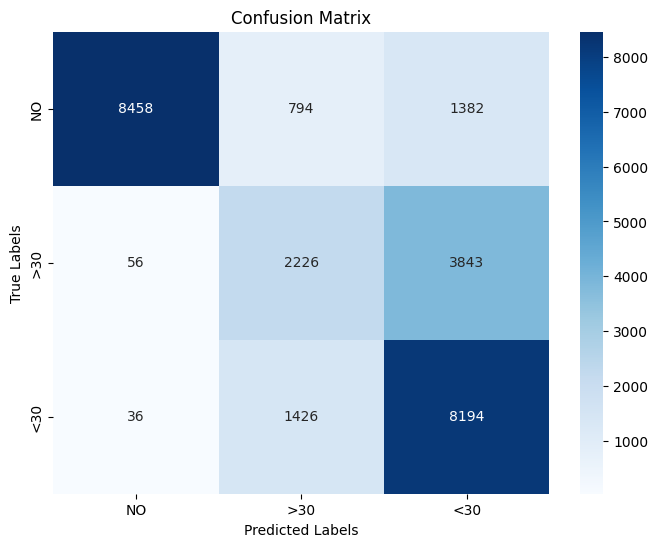

In [176]:
y_pred_rf, y_pred_prob_rf, rf_metrics_list = evaluate_model(best_rf_model, X_test, y_test)

## **KNN** 

Next, the K-Nearest Neighbors (KNN) model was implemented and evaluated. Similar to the Random Forest, hyperparameter tuning was performed using grid search with stratified cross-validation, optimized for the f-1 score. The grid search was performed over such parameters as 'n_neighbours', 'weights', and 'p'. The 'n_neighbours' parameter defines the number of neighbors used for classification. A smaller value of 'n_neighbors' makes the model more sensitive to local variations in the data, potentially leading to a more complex decision boundary. On the other hand, a larger value smoothens the decision boundary, making the model more robust to noise but potentially missing fine details in the data. The 'weights' parameter determines the weight assigned to each neighbor in the voting or averaging process. It can take two values: 'uniform' or 'distance'. For 'uniform', all neighbors contribute equally to the decision, while for 'distance', closer neighbors have a greater influence on the prediction. This is implemented by assigning weights inversely proportional to the distance. Lastly, 'p' parameter represents the power parameter for the Minkowski distance metric. When p=1, it corresponds to the Manhattan distance (L1 norm), and when p=2, it corresponds to the Euclidean distance (L2 norm). The choice of distance metric influences how the algorithm measures the distance between data points. p=1 (Manhattan distance) might be more robust to outliers and irrelevant dimensions, while p=2 (Euclidean distance) is more sensitive to the differences in all dimensions.

The k-Nearest Neighbors (KNN) algorithm is a versatile and widely used machine learning algorithm for both classification and regression tasks. The KNN algorithm, implemented in the scikit-learn library, is based on the principle of proximity, where the class or value of an unknown data point is determined by the classes or values of its k nearest neighbors in the feature space.

The core idea behind the KNN algorithm is to assign a label or value to an unclassified data point based on the labels or values of its nearest neighbors. The term "k" refers to the number of neighbors considered for making the decision. The algorithm is non-parametric, meaning it does not make any assumptions about the underlying distribution of the data.

In our scenario of a classification task, given a dataset with labeled instances, KNN determines the class of an unknown instance by a majority vote among its k nearest neighbors. 

Mathematically, let X be a feature space, $x_i$ be an instance in X, and $y_i$ be the corresponding class label. The dataset can be represented as {($x_1$,$y_1$),($x_2$,$y_2$),...,($x_n$,$y_n$)}, where n is the number of instances in the dataset.

For a given test instance $x_{test}$, the distance between $x_{test}$ and $x_i$ can be calculated using a distance metric, commonly the Euclidean distance:
$$d(x_{test},x_i) = \sqrt{\sum_{j=1}^{n} (x_{test,j} - x_{i,j})^2} $$

Other distance metrics, such as Manhattan distance or Minkowski distance, can also be used based on the problem requirements.

Once the distances are computed, the algorithm identifies the k instances with the smallest distances to $x_{test}$. For classification, the class label of x_{test} is determined by a majority vote among the labels of its k nearest neighbors:
$$y_{test} = \text{argmax}_y \sum_{i=1}^{k} I(y_i=y)$$

Here, $y_{test}$ is the predicted class label for $x_{test}$, I is the indicator function that takes the value 1 if a certain condition is true and 0 otherwise, and y ranges over the possible class labels.

We implemented this algorithm using KNeighborsClassifier class from sklearn. 




### **Model** 

In [146]:
# Create and train the K-nearest neighbors model
def knn_model(X, y, params, nsplits, scoring_metric):
    """
    Create and train a K-nearest neighbors model using grid search for hyperparameter tuning.

    Parameters:
      X (pd.DataFrame): Feature matrix.
      y (pd.Series): Target variable.
      params (dict): Hyperparameter grid for grid search.
      nsplits (int): Number of splits for cross-validation.
      scoring_metric (str): Scoring metric for grid search.

    Returns:
      grid_search (GridSearchCV): Trained grid search object.
      best_knn_model (KNeighborsClassifier): Trained K-nearest neighbors model with best hyperparameters.
    """
    # Define an KNN model
    knn_model = KNeighborsClassifier()

    # Perform grid search with stratified 10-fold cross-validation
    cv = StratifiedKFold(n_splits=nsplits)
    grid_search = GridSearchCV(knn_model, param_grid, cv=cv, scoring=scoring_metric)

    grid_search.fit(X, y)

    # Get the best hyperparameters
    best_params = grid_search.best_params_

    best_knn_model = KNeighborsClassifier(**best_params)
    best_knn_model.fit(X, y)

    return grid_search, best_knn_model


# Set up a grid of hyperparameters to search
param_grid = {
    "n_neighbors": [3, 5, 7, 9],
    "weights": ["uniform", "distance"],
    "p": [1, 2],  # 1 for Manhattan distance, 2 for Euclidean distance
}

knn_gs, best_knn_model = knn_model(
    X_train, y_train, params=param_grid, nsplits=10, scoring_metric="f1_weighted"
)

### **Predictions and Evaluation** 

As a result of the grid search, an optimal parameter set of 'n_neighbors': 5, 'p': 1, 'weights': 'distance' was selected for testing. We computed the same metrics as before and got the following results: accuracy: 0.69, precision: 0.67, recall: 0.69, f1 score: 0.67 , ROC-AUC: 0.83.

Just like the RF model, the KNN model is doing an exceptional job predicitng patients of class 'NO', while struggling with the other two classes.

The ROC-AUC curve supports this idea, with the AUC score for the 'NO' class being extraordinary 0.96. Class '<30' received the AUC of 0.81 and Class '>30' has a AUC score of 0.72, which is still quite high.

In [147]:
# Optimal parameters
knn_gs.best_params_

{'n_neighbors': 5, 'p': 1, 'weights': 'distance'}

Accuracy: 0.69
Precision: 0.67
Recall: 0.69
F1 Score: 0.67
ROC-AUC: 0.83


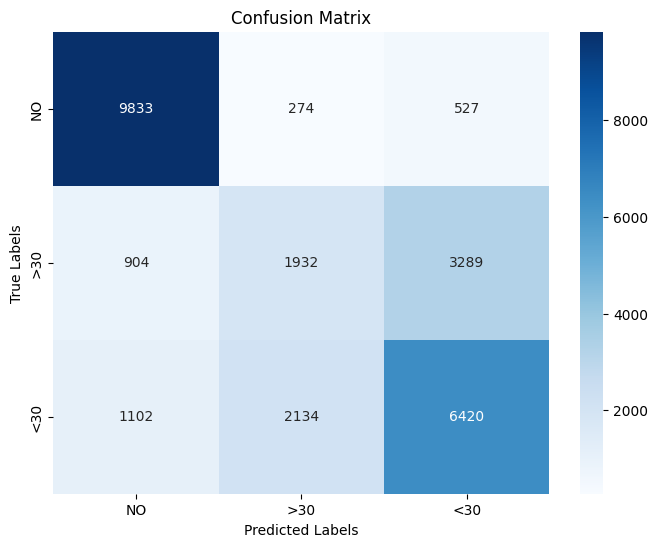

In [177]:
# Generate predictions, evaluate the model, produce relevant plots
y_pred_knn, y_pred_prob_knn, knn_metrics_list = evaluate_model(best_knn_model, X_test, y_test)

## **CNN** 

The Convolutional Neural Network (CNN) is a type of deep neural network. At the core of CNNs are convolutional layers, which perform convolutions on input data to learn spatial hierarchies of features. A convolution is a mathematical operation that combines input data with a filter or kernel, which is a small learnable weight matrix. The convolutional layer slides these filters over the input data to detect patterns, such as edges, textures, or more complex structures.

Mathematically, the convolution operation (assuming 2D input and kernel) is defined as:
$$I \cdot K = \sum_{m}\sum_{n}I(i-m,j-n)K(m,n) $$

Here, I represents the input matrix, K is the kernel, and ($I \cdot K$) denotes the convolution result. i and j are the indices representing the spatial location of the output of the convolution operation, while m and n are the indices used for the summation, representing the spatial location within the filter or kernel. The nested summations cover the spatial dimensions of the input and kernel.

Pooling layers are another integral component of CNNs. They are employed to downsample the spatial dimensions of the input data, reducing the computational load and providing a form of translation invariance. Max pooling, for example, selects the maximum value from a group of neighboring values, effectively retaining the most important information.

A CNN typically consists of multiple convolutional and pooling layers arranged in a hierarchical fashion. The final layers are usually fully connected layers, responsible for combining high-level features and making predictions. The output layer typically employs a softmax activation function for classification tasks.

The forward pass in a CNN involves passing the input through each layer, applying convolutions, non-linear activations (commonly ReLU), and pooling operations. The network's parameters, including the weights and biases of each layer, are updated during training using backpropagation and an optimization algorithm like stochastic gradient descent (SGD).

The loss function quantifies the difference between predicted and true labels, and the goal of training is to minimize this loss. The backpropagation algorithm calculates the gradients of the loss with respect to the network's parameters, facilitating weight updates.

Mathematically, the backpropagation algorithm involves computing the gradients of the loss function (L) with respect to the weights (W) and biases (b) of the network. The chain rule of calculus is applied iteratively to compute these gradients, and the updated weights are determined by the optimization algorithm:
$$W_{new} = W_{old} -α \frac{∂L}{∂W}$$

Here, α is the learning rate, which determines the size of the steps taken during optimization.

In Keras, building a CNN is facilitated through high-level abstractions. Layers are added sequentially to a model, and the model is then compiled with a specific optimizer, loss function, and evaluation metric. The fit() method is used to train the model on training data.

In our implementation, we followed the best practices of building and implementing the CNNs. Specifically, The cnn_hypertune function creates a CNN model with tunable hyperparameters. The architecture includes convolutional layers, max-pooling, flattening, dense layers, dropout regularization, and an output layer. The hyperparameters are configured using the Hyperparameter tuning capability provided by Keras Tuner.

The convolutional layers are dynamically added based on the hyperparameter num_conv_layers. Each convolutional layer has tunable filters, kernel size, and ReLU activation. The input shape is set to (135, 1) to match the expected input dimensions. We were experimenting with the numbe rof convolutional layers ranging from 2 to 4, kernel sizes of 5, 7, and 9, and the number of filters fro, 32 to 256 with the intervals of 32.

A max-pooling layer with a pool size of 2 is added after the convolutional layers to downsample the spatial dimensions.

The model is flattened to transform the multi-dimensional output into a one-dimensional array.

Dense layers are added based on the hyperparameter num_dense_layers. The number of Dense layers also ranged from 2 to 4. Each dense layer has tunable units and ReLU activation. The number of neurons in the Dence layers was searched in the range of 128 and 512.

A dropout layer is added to introduce regularization, with the dropout rate being a tunable hyperparameter.

The output layer consists of three units with softmax activation, suitable for a classification task with three classes.

The Adam optimizer with a tunable learning rate is used for compilation. The initial learning rate was set to 0.0001. The model is then compiled with the sparse categorical crossentropy loss function and accuracy as the metric.

Two callback functions, ReduceLROnPlateau and EarlyStopping, are defined for dynamically adjusting the learning rate and stopping training early if needed.

A RandomSearch tuner is instantiated to search for the best hyperparameters. The objective is set to 'val_accuracy,' and the search is conducted with a limited number of trials (max_trials) and results are stored in the specified directory.

The tuner's search method is then called with the training data, specifying the number of epochs, validation split of 0.2, and callback functions for learning rate reduction and early stopping.



### **Model** 

In [134]:
# Function to create the CNN model
def cnn_hypertune(hp):
    model = keras.Sequential()

    # Convolutional layers
    for i in range(hp.Int("num_conv_layers", min_value=2, max_value=4)):
        model.add(
            layers.Conv1D(
                filters=hp.Int(f"filters_{i}", min_value=32, max_value=256, step=32),
                kernel_size=hp.Choice(f"kernel_size_{i}", values=[5, 7, 9]),
                activation="relu",
                input_shape=(135, 1),
            )
        )

    model.add(layers.MaxPooling1D(pool_size=2))

    model.add(layers.Flatten())

    # Dense layers
    for i in range(hp.Int("num_dense_layers", min_value=2, max_value=4)):
        model.add(
            layers.Dense(
                units=hp.Int(
                    f"dense_units_{i}", min_value=128, max_value=512, step=128
                ),
                activation="relu",
            )
        )

    model.add(
        layers.Dropout(
            rate=hp.Float(f"dropout_rate", min_value=0.2, max_value=0.5, step=0.2)
        )
    )

    # Output layer
    model.add(layers.Dense(3, activation="softmax"))

    opt = keras.optimizers.Adam(learning_rate=0.0001)

    # Compile the model
    model.compile(
        optimizer=opt, loss="sparse_categorical_crossentropy", metrics=["accuracy"]
    )

    return model


# Define callbacks
reduce_lr = keras.callbacks.ReduceLROnPlateau(
    monitor="val_loss", factor=0.5, patience=2, min_lr=0, mode="min", verbose=1
)
early_stop = keras.callbacks.EarlyStopping(
    monitor="val_loss", patience=3, restore_best_weights=True, verbose=1
)

# Instantiate the tuner
tuner = RandomSearch(
    cnn_hypertune,
    objective="val_accuracy",
    max_trials=5,  # Number of hyperparameter combinations to try
    directory="cnn_hypertuning",  # Directory to store the search results
    project_name="cnn_hyperparameter_tuning",
)

# Search for the best hyperparameters
tuner.search(
    X_train, y_train, epochs=5, validation_split=0.2, callbacks=[reduce_lr, early_stop]
)

Trial 5 Complete [00h 15m 01s]
val_accuracy: 0.8955824971199036

Best val_accuracy So Far: 0.9619868993759155
Total elapsed time: 00h 59m 01s


### **Predictions and Evaluation** 

After the random parameter search was complete, we detrmined the optimal set of parameters as follows : 'num_conv_layers': 2, 'filters_0': 160, 'kernel_size_0': 5, 'filters_1': 160, 'kernel_size_1': 9, 'num_dense_layers': 3, 'dense_units_0': 256, 'dense_units_1': 128, 'dropout_rate': 0.2, 'dense_units_2': 128.

We then extracted the best model from the Keras Tuner and evaluated it on the test set as with the previous algorithms. The resultant performance metrics were as follows : accuracy: 0.69, precision: 0.69, recall: 0.69, f1 score: 0.68, ROC-AUC: 0.84.

The confusion matrix and the ROC-AUC plot displays very similar patterns to the previous algorithms.

In [135]:
# Get the best hyperparameters
best_hyperparameters = tuner.oracle.get_best_trials(num_trials=1)[
    0
].hyperparameters.values

print(best_hyperparameters)

{'num_conv_layers': 2, 'filters_0': 160, 'kernel_size_0': 5, 'filters_1': 160, 'kernel_size_1': 9, 'num_dense_layers': 3, 'dense_units_0': 256, 'dense_units_1': 128, 'dropout_rate': 0.2, 'dense_units_2': 128}


In [ ]:
# Build the model with the best hyperparameters
best_cnn_model = tuner.get_best_models(num_models=1)[0]

In [117]:
best_cnn_model 

826/826 [==============================] - 10s 12ms/step
Accuracy: 0.69
Precision: 0.69
Recall: 0.69
F1 Score: 0.68
ROC-AUC: 0.84


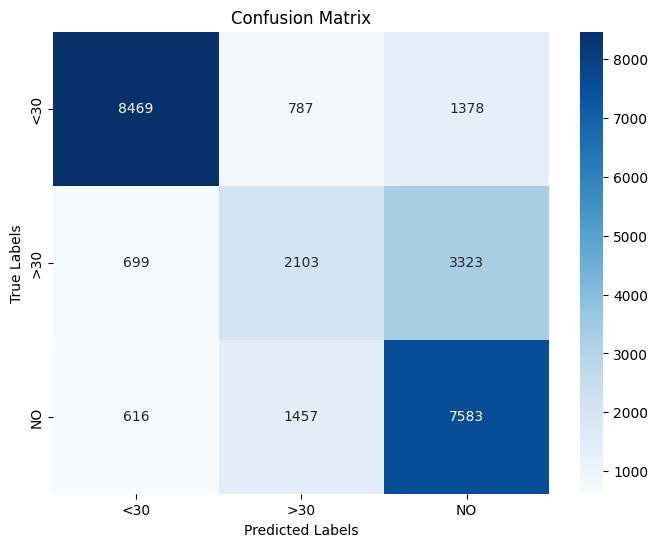

In [142]:
# Evaluate the CNN model
y_pred_cnn, y_pred_prob_cnn, cnn_metrics_list = evaluate_model(best_cnn_model, X_test, y_test,cnn=True)

# **ML Models Comparison**

In this project, we implemented three models, Random Forest, KNN, and CNN, to classify patients into three 'readmitted' categories based on a number of features.

Random Forest is well-suited for this task due to its ability to handle a mix of numerical and categorical features present in healthcare datasets. Random Forest's ensemble approach, aggregating predictions from multiple decision trees, enhances robustness against overfitting, providing more reliable generalization to diverse patient cases. Despite its advatages, Random Forest might not capture intricate spatial dependencies within the data. In healthcare scenarios, the lack of spatial modeling might result in overlooking subtle patterns relevant to readmission.

KNN is advantageous if the distinct clusters of patients contribute to readmission patterns. KNN is effective when local patterns are essential, and its distance-based approach aligns well with scenarios where proximity in feature space indicates similar readmission outcomes. In terms of diadvantages, KNN's sensitivity to outliers may be a concern in large healthcare data where unusual patient cases exist. Furthermore, its performance might be suboptimal when feature importance is not uniformly distributed or when the readmission patterns are not well-clustered.

Even though CNNs are particularly advantageous when dealing with sequential or image-based data, they can still capture spatial dependencies in healthcare datasets. Their hierarchical feature learning makes them adept at discerning complex patterns. CNNs also handle automatically learned feature representations, alleviating the need for extensive manual feature engineering. Despite their prowess, CNNs demand substantial computational resources, and training is very time-consuming. Also, an extremely large number of hyperparameters makes it hard to find the optimal parameter set, limiting the model's predicitve potential.

As we can see, all three models are suitable for our task. Judging by the test results, all three algorithms are almost exactly the same across all metrics, with Random Forest being slightly better.

# **Improvements**

We saw that the models could have better predicted the 'readmitted' categories. This, however, sets path for future work and improvements.

First, the dataset needed to be more balanced, as we had almost thrice as many patients in '>30' class and almost five times as many patients in 'NO' class than in '<30' class before applying balancing techniques. Even after we have applied under and over sampling method via SMOTETomek for the minority class, we still did not balance the classes perfectly. The reason was to try and find a nice balancd between having balanced data and accurately representing the reality (which means, keeping test data imbalanced as they come in real life). We have learned the importance of this imbalance when we looked at the accuracy, precision, recall, and f-1 test results, which were only slightly better than chance.

Second, we could explore the possibility of defining two classification classes instead of three: 'Yes' if the patients were readmitted within 30 days ('<30') and 'No' if they weren't ('NO' and '>30'), as one might count being readmitted more than 30 days after the initial disacharge as a whole new visit rather than a readmission. If we made this transformation, then there could be more noticeable differences between the patients, and the models would learn and perform better.

Lastly, I have trained my models on the dataset from which I deleted almost half of all original features. Perhapse some of the deleted features did indeed carry useful predictive information, which means it would be interesting to compare the current results to the models trained on the full dataset.

In addition to the mentioned improvements, the next steps should include trying out more different ML algorithms, such as SVMs, XGBoost, and others, to see if some algorithms can capture the differences between the 'readmitted' categories better or if the data's quality is too bad for this task.

In the context of the current results, we have learned that the information contained in the remaning demographic, medication, and clinical features is quite informative about a patient's likelihood of reamdission. Hence, another essential step for this project will be to apply interpretation techniques like SHAP to understand which features exactly contribute most to a patient being more likely to be readmitted.

# **AI Statement**

No AI tools were used

# **Data Ethics**

The dataset was obtained legally from a publically available repository : https://archive.ics.uci.edu/dataset/296/diabetes+130-us+hospitals+for+years+1999-2008